In [1]:
using Plots
using LinearAlgebra
using LaTeXStrings
using StatsBase
using CSV
using DataFrames

In [2]:
t_start = time();

## Parameters:

In [3]:
t0 = 1.0;
t = 1.0;
m_0 = -1.0;
Delta = 1.0;
x_periodic = 0;
y_periodic = 0;

L = 60;

Lx = L;
Ly = L;

exportdata=1;

Equation of two lines are $y = mx + c_1$ and $y = mx + c_2$

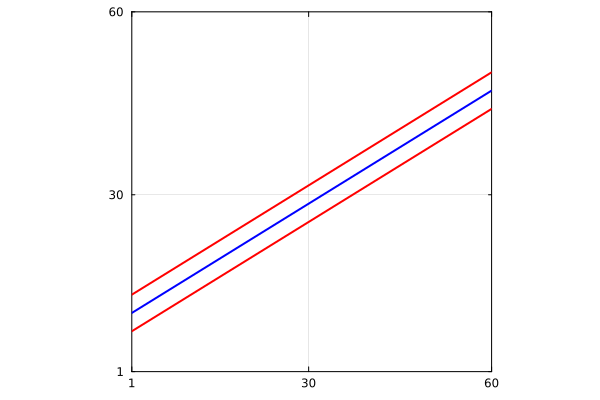

In [4]:
m = (-1+sqrt(5))/2
# m=2/3;
c1 = 7
c2 = 13

# c1 = -4;
# c2 = 6;

function line_down(x::Float64)
    return c1 + m*x
end

function line_up(x::Float64)
    return c2 + m*x
end

function line_middle(x::Float64)
    return (line_up(x) + line_down(x))/2
end

line_x = [1.0,L]
line_down_y = line_down.(line_x)
line_up_y = line_up.(line_x)

plt00= plot(line_x,line_down_y,color="red",width=2, xlims=(1,Lx),ylims=(1,Ly),legend=:none,aspect_ratio=:equal,frame=:box, framestyle=:thick,xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly])
plt00=plot!(line_x,line_up_y,color="red",width=2)
plt00=plot!(line_x,line_middle.(line_x),color="blue",width=2)

In [5]:
points_x_array = range(1, L,L)
points_y_array = range(1, L,L)

points2 = zeros(2*L^2)
for ii = 1:L
    for jj = 1:L
        points2[2*((jj-1)*L+ii)-1] = points_x_array[ii]
        points2[2*((jj-1)*L+ii)] = points_y_array[jj]
    end
end


### These arrays have N^2 elements, and hold the x and y coordinates of nth site
points_x_array = points2[1:2:end]
points_y_array =  points2[2:2:end]

site_index = range(1,L^2, L^2)

1.0:1.0:3600.0

### Now we isolate the PTB points

### The array PTB_index (with number of elements N_PTB) contains the parent lattice indices contained in PTB

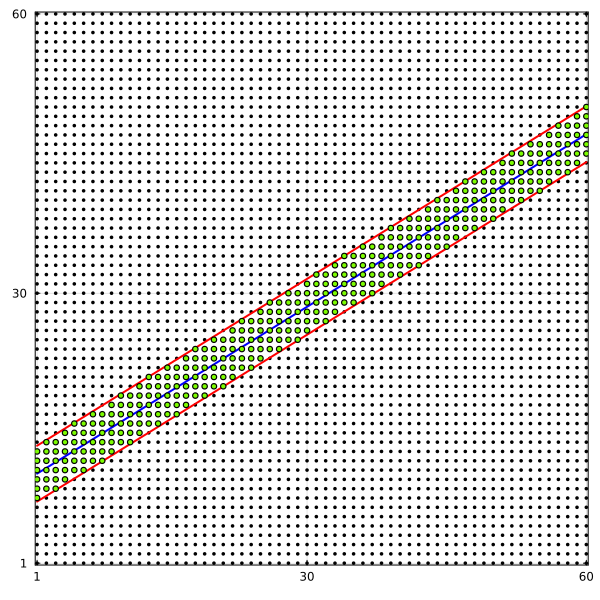

In [6]:
### PTB_index will contain ordered indices of the sites in PTB

PTB_index_dummy = collect(range(1,L^2,L^2))
for ii = 1:L^2
    if (points_y_array[ii] >= line_down(points_x_array[ii])) && (points_y_array[ii] <= line_up(points_x_array[ii]))
        ## Do nothing
    else
        PTB_index_dummy[ii] = 0.0
    end
end

## Here we store non-zero indices
PTB_index = findall(!iszero, PTB_index_dummy)

N_PTB = size(PTB_index)[1]

points_PTB_array_x = zeros(N_PTB)
points_PTB_array_y = zeros(N_PTB)

for ii = 1:N_PTB
    points_PTB_array_x[ii] = points_x_array[PTB_index[ii]]
    points_PTB_array_y[ii] = points_y_array[PTB_index[ii]]
end

### Draw lines separating PTB
line_x = [1.0,L]
line_down_y = line_down.(line_x)
line_up_y = line_up.(line_x)

plt_lattice=scatter(points_x_array, points_y_array,aspect_ratio=1,legend=false, 
                    xlims=[0.8,L+0.2], ylims=[0.8,L+0.2],color="black",markersize=2, frame=:box, framestyle=:thick, xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly], size=(600,600))
plt_lattice=plot!(line_x,line_down_y,color="red",width=2)
plt_lattice=plot!(line_x,line_up_y,color="red",width=2)
plt_lattice=plot!(line_x,line_middle.(line_x),color="blue",width=2)
plt_lattice=scatter!(points_PTB_array_x, points_PTB_array_y,color="lawngreen",aspect_ratio=1,legend=false,markersize=3)

## Percentage of sites in PTB

In [7]:
println("Number of sites in PTB = ",N_PTB)
println("Amount of sites in PTB = ",100* N_PTB/L^2, " %")

Number of sites in PTB = 360
Amount of sites in PTB = 10.0 %


In [8]:
println(PTB_index)

[421, 481, 482, 483, 541, 542, 543, 544, 601, 602, 603, 604, 605, 606, 661, 662, 663, 664, 665, 666, 667, 668, 721, 722, 723, 724, 725, 726, 727, 728, 729, 782, 783, 784, 785, 786, 787, 788, 789, 790, 791, 844, 845, 846, 847, 848, 849, 850, 851, 852, 905, 906, 907, 908, 909, 910, 911, 912, 913, 914, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 1029, 1030, 1031, 1032, 1033, 1034, 1035, 1036, 1037, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1152, 1153, 1154, 1155, 1156, 1157, 1158, 1159, 1160, 1161, 1213, 1214, 1215, 1216, 1217, 1218, 1219, 1220, 1221, 1222, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1337, 1338, 1339, 1340, 1341, 1342, 1343, 1344, 1345, 1398, 1399, 1400, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1460, 1461, 1462, 1463, 1464, 1465, 1466, 1467, 1468, 1469, 1522, 1523, 1524, 1525, 1526, 1527, 1528, 1529, 1530, 1583, 1584, 1585, 1586, 1587, 1588, 1589, 1590, 1591, 1592, 1645, 1646, 1647, 1648, 1649, 1650, 1651, 1652, 1653, 1706, 1707, 1

## Coordinates of projected sites

### Equation of line_down is $y=mx + c_1$
### Equation of projector line is, $y-y_1 = (-1/m).(x-x_1)$, where $(x_1,y_1)$ is the coordinate of the site
### The two lines intersect at $((m.y_1 + x_1 - m.c_1)/(m^2 + 1), (m^2.y_1 + m.x_1 + c_1)/(m^2 + 1))$

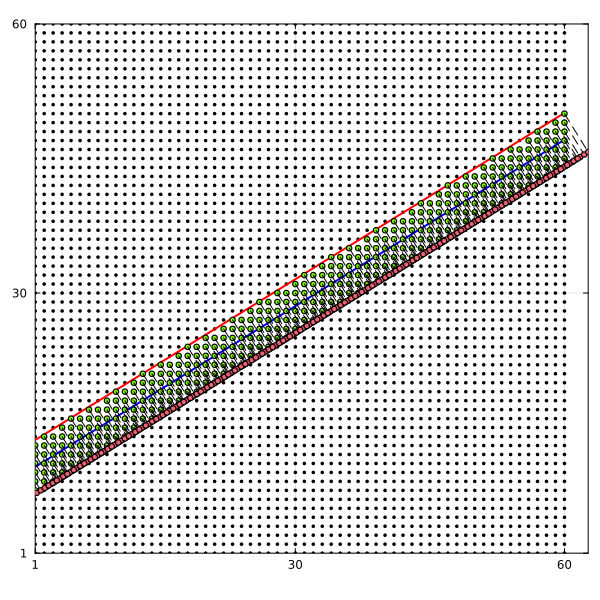

In [9]:
projected_points_PTB_array_x = (m*points_PTB_array_y + points_PTB_array_x - m*ones(N_PTB)*c1)/(m^2 + 1);
projected_points_PTB_array_y = m*projected_points_PTB_array_x + c1 * ones(N_PTB);

## This array contains distance along the line
## This should be x coordinates on the line * sec(theta), where the slope is tan(theta) = m
distance_along_projected_line = projected_points_PTB_array_x * sqrt(m^2 +1)

for ii = 1:N_PTB
    line_projected_x = [points_PTB_array_x[ii],projected_points_PTB_array_x[ii]]
    line_projected_y = [points_PTB_array_y[ii],projected_points_PTB_array_y[ii]]
    plt_lattice=plot!(line_projected_x,line_projected_y,linestyle=:dash, color="black")
end
plt_lattice=scatter!(projected_points_PTB_array_x,projected_points_PTB_array_y, 
            xlims=(1,maximum(vcat(projected_points_PTB_array_x,Lx))), ylims=(1,maximum(vcat(projected_points_PTB_array_y,Ly))), markersize=3)
display(plt_lattice)

## Generate Parent Hamiltonian

In [10]:
include("generate_matrices1D.jl")
include("generate_matrices2D.jl")
include("angmom.jl")

generate_spin_matrices (generic function with 1 method)

In [11]:
println("t = ",t)
println("m_0 = ", m_0)
println("Delta = ",Delta)
println("Lx = ", Lx)
println("Ly = ", Ly)

t = 1.0
m_0 = -1.0
Delta = 1.0
Lx = 60
Ly = 60


In [12]:
if(x_periodic^2 != x_periodic || y_periodic^2 != y_periodic)
    println("x_periodic and y_periodic must be 0 or 1")
    println("You entered x_periodic = ", x_periodic, " y_periodic = ", y_periodic)
    return
end

In [13]:
sigma_x = [0 1;
           1 0];
sigma_y = [0 -im;
           im 0];
sigma_z = [1 0;
           0 -1];
eye2 = [1 0;
        0 1];
gamma_01 = kron(eye2, sigma_x);
gamma_02 = kron(eye2, sigma_y);
gamma_03 = kron(eye2, sigma_z);
gamma_10 = kron(sigma_x, eye2);
gamma_13 = kron(sigma_x, sigma_z);
gamma_20 = kron(sigma_y, eye2);
gamma_30 = kron(sigma_z, eye2);
gamma_31 = kron(sigma_z, sigma_x);
gamma_32 = kron(sigma_z, sigma_y);
gamma_33 = kron(sigma_z, sigma_z);

In [14]:
const_2D, CX2D, SX2D, CY2D, SY2D, CXCY2D, SXCY2D, CXSY2D = generate_matrices_2D(Lx,Ly,x_periodic,y_periodic)

CXCY2D= Nothing
SXCY2D= Nothing
CXSY2D= Nothing

Verified: Building Block Matrices are Hermitian


Nothing

In [15]:
h_2DHO = t*kron(SX2D,gamma_31) + t*kron(SY2D,gamma_32) + kron(m_0*const_2D + t0*(CX2D + CY2D),gamma_33) + Delta*kron(CX2D - CY2D,gamma_10)

## Here is the Hamiltonian of regular Chern insulator for quick check
#h_SC_chern = Hermitian(t*kron((SX2D),sigma_x) + t*kron(SY2D,sigma_y) + kron((m_0)*const_2D - t0*(CX2D + CY2D),sigma_z))

if(Hermitian_Check(h_2DHO) == false)
    println("Error! Hamiltonian is not Hermitian")
    return
end

## Clear Variables

In [16]:
const_2D= Nothing
CX2D= Nothing
SX2D= Nothing
CY2D= Nothing
SY2D= Nothing
CXCY2D= Nothing
SXCY2D= Nothing
CXSY2D= Nothing

Nothing

## Now generate PTB Hamiltonian

In [17]:
PTB_orbital_index = ones(4*N_PTB);
for ii = 1:N_PTB
    PTB_orbital_index[4*ii-3] = 4*PTB_index[ii]-3
    PTB_orbital_index[4*ii-2] = 4*PTB_index[ii]-2
    PTB_orbital_index[4*ii-1] = 4*PTB_index[ii]-1
    PTB_orbital_index[4*ii] = 4*PTB_index[ii]
end
println(PTB_orbital_index)

[1681.0, 1682.0, 1683.0, 1684.0, 1921.0, 1922.0, 1923.0, 1924.0, 1925.0, 1926.0, 1927.0, 1928.0, 1929.0, 1930.0, 1931.0, 1932.0, 2161.0, 2162.0, 2163.0, 2164.0, 2165.0, 2166.0, 2167.0, 2168.0, 2169.0, 2170.0, 2171.0, 2172.0, 2173.0, 2174.0, 2175.0, 2176.0, 2401.0, 2402.0, 2403.0, 2404.0, 2405.0, 2406.0, 2407.0, 2408.0, 2409.0, 2410.0, 2411.0, 2412.0, 2413.0, 2414.0, 2415.0, 2416.0, 2417.0, 2418.0, 2419.0, 2420.0, 2421.0, 2422.0, 2423.0, 2424.0, 2641.0, 2642.0, 2643.0, 2644.0, 2645.0, 2646.0, 2647.0, 2648.0, 2649.0, 2650.0, 2651.0, 2652.0, 2653.0, 2654.0, 2655.0, 2656.0, 2657.0, 2658.0, 2659.0, 2660.0, 2661.0, 2662.0, 2663.0, 2664.0, 2665.0, 2666.0, 2667.0, 2668.0, 2669.0, 2670.0, 2671.0, 2672.0, 2881.0, 2882.0, 2883.0, 2884.0, 2885.0, 2886.0, 2887.0, 2888.0, 2889.0, 2890.0, 2891.0, 2892.0, 2893.0, 2894.0, 2895.0, 2896.0, 2897.0, 2898.0, 2899.0, 2900.0, 2901.0, 2902.0, 2903.0, 2904.0, 2905.0, 2906.0, 2907.0, 2908.0, 2909.0, 2910.0, 2911.0, 2912.0, 2913.0, 2914.0, 2915.0, 2916.0, 3125.0,

In [18]:
outside_orbital_index = setdiff(1:4*Lx*Ly,PTB_orbital_index);
println(outside_orbital_index)

[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 158.0, 1

In [19]:
NOrbitalsOutside = 4*Lx*Ly - 4*N_PTB

12960

In [20]:
NOrbitalsInside = 4*N_PTB

1440

In [21]:
H_PTB_renor = zeros(NOrbitalsInside,NOrbitalsInside)*im;

H_11 = zeros(NOrbitalsInside,NOrbitalsInside)*im;

H_22 = zeros(NOrbitalsOutside,NOrbitalsOutside)*im;

H_21 = zeros(NOrbitalsOutside,NOrbitalsInside)*im;

H_12 = zeros(NOrbitalsInside,NOrbitalsOutside)*im;

In [22]:
for ii = 1:NOrbitalsInside
    for jj = 1:NOrbitalsInside
        H_11[ii,jj] = h_2DHO[Int(PTB_orbital_index[ii]), Int(PTB_orbital_index[jj])]
    end
end

In [23]:
Threads.@threads for ii = 1:NOrbitalsOutside
    for jj = 1:NOrbitalsOutside
        H_22[ii,jj] = h_2DHO[Int(outside_orbital_index[ii]), Int(outside_orbital_index[jj])]
    end
end

In [24]:
Threads.@threads for ii = 1:NOrbitalsInside
    for jj = 1:NOrbitalsOutside
        H_12[ii,jj] = h_2DHO[Int(PTB_orbital_index[ii]), Int(outside_orbital_index[jj])]
    end
end

In [25]:
Threads.@threads for ii = 1:NOrbitalsOutside
    for jj = 1:NOrbitalsInside
        H_21[ii,jj] = h_2DHO[Int(outside_orbital_index[ii]), Int(PTB_orbital_index[jj])]
    end
end

## Clear variables

In [26]:
h_2DHO = Nothing

Nothing

## Add a small constant matrix to invert matrix H_22 in case its eigenvalue is 0

In [27]:
H_PTB_renor = H_11 - Hermitian(H_12*inv(Hermitian(H_22 + 10^(-8)*Matrix(1.0I, NOrbitalsOutside, NOrbitalsOutside)))*H_21);

In [28]:
H_11= Nothing
H_12= Nothing
H_21= Nothing
H_22= Nothing

Nothing

In [29]:
if(Hermitian_Check(H_PTB_renor) == false)
    println("Error! Hamiltonian is not Hermitian")
    return
end

### Calculation of localization Marker

In [30]:
## Store the x and y coordinates of the sites in PTB
YList_PTB = ceil.(PTB_index/Lx);
XList_PTB = PTB_index - (YList_PTB - ones(N_PTB))*Lx;

In [31]:
## Kronecker product to get the orbitals
XListKron_PTB = kron(XList_PTB,[1,1,1,1]);
YListKron_PTB = kron(YList_PTB,[1,1,1,1]);

X1_PTB = diagm(XListKron_PTB);
Y1_PTB = diagm(YListKron_PTB);

In [32]:
function matrix_signature(LMaxtrix)
    eigsL = eigvals(LMaxtrix);
    pos_count = 0;
    neg_count = 0;
    for eig in eigsL
        if real(eig) > 0
            pos_count += 1;
        elseif real(eig) < 0
            neg_count += 1;
        end
    end
    return (pos_count - neg_count)
end

matrix_signature (generic function with 1 method)

In [33]:
dlist_PTB = (X1_PTB + Y1_PTB)/2;

In [34]:
size(dlist_PTB)

(1440, 1440)

In [35]:
N_PTB

360

In [36]:
const_mat_PTB_orbitals = zeros(4*N_PTB,4*N_PTB);
for ii = 1:4*N_PTB
    const_mat_PTB_orbitals[ii,ii] = 1;
end

const_mat_PTB_sites = zeros(N_PTB,N_PTB);
for ii = 1:N_PTB
    const_mat_PTB_sites[ii,ii] = 1;
end

In [37]:
middle_line_x_coordinates = 1:Lx;
middle_line_y_coordinates = round.(line_middle.(float(middle_line_x_coordinates)));

In [38]:
## This function pltos density in the parent lattice
function plotState(local_density, Lx, Ly)
	
	density = zeros(Lx,Ly)

	for a = 1:Lx
		for b = 1:Ly
			density[a,b] = local_density[a + (b-1)*Lx];
		end
	end

	
	xx = range(1, stop=Lx, length=Lx)
	yy = range(1, stop=Ly, length=Ly)

	xx = repeat(xx, 1, Ly)'
	yy = repeat(yy, 1, Lx)

	# point_size = 500 * vec(density')

plt = scatter(
    vec(xx), vec(yy),
    marker_z = vec(density'),
    color = cgrad([:white, :red]), # Consider cgrad(:viridis) for colorblind-friendly
    legend = false,
    xlabel = "X",
    ylabel = "Y",
    title = "Joint LDoS low energy states",
    markerstrokewidth = 0,
    aspect_ratio = 1,
    colorbar_title = "Density",
    colorbar = true,
    yguidefontrotation = 270, # Rotates the Y label vertically
    framestyle = :box,
    xlims = (0.5, Lx + 0.5),
    ylims = (0.5, Ly + 0.5),
    xticks = [1, Lx ÷ 2, Lx],
    yticks = [1, Ly ÷ 2, Ly],
    markersize = 8,
    tickfont = font(18, "Computer Modern"),
    guidefont = font(22, "Computer Modern"),
    titlefont = font(24, "Computer Modern"),
    colorbar_tickfont = font(16, "Computer Modern"),
    colorbar_titlefont = font(18, "Computer Modern"),
    grid = false,
    size = (700, 700)
)

plt = plot!(line_x,line_down_y,color="red",width=2, xlims=(0,Lx+1),ylims=(0,Ly+1),legend=:none,aspect_ratio=:equal,frame=:box, framestyle=:thick,xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly])
plt = plot!(line_x,line_up_y,color="red",width=2)
plt = plot!(line_x,line_middle.(line_x),color="blue",width=2)

return plt

end

plotState (generic function with 1 method)

In [39]:
function state_to_real_space_LDoS(v::Array{ComplexF64})
    n_sites = Int(size(v)[1]/4)
    prob_dist = zeros(n_sites)
    for ii = 1:n_sites
        prob_dist[ii] = abs(v[4*ii-3])^2 +  abs(v[4*ii-2])^2 + abs(v[4*ii-1])^2 + abs(v[4*ii])^2
    end
    return prob_dist
end 

state_to_real_space_LDoS (generic function with 1 method)

In [40]:
function plotPTB_state_in_parent_lattice(v::Array{ComplexF64}, Lx, Ly)
    local_density_on_PTB = state_to_real_space_LDoS(v)

    local_density_on_lattice = zeros(Lx*Ly)
    for ii = 1:length(local_density_on_PTB)
        local_density_on_lattice[Int(PTB_index[ii])] = local_density_on_PTB[ii]
    end
    plotState(local_density_on_lattice, Lx, Ly)
end

plotPTB_state_in_parent_lattice (generic function with 1 method)

In [41]:
function plotPTB_density_in_parent_lattice(v::Array{Float64}, Lx, Ly)
    local_density_on_lattice = zeros(Lx*Ly)
    for ii = 1:length(v)
        local_density_on_lattice[Int(PTB_index[ii])] = v[ii]
    end
    plotState(local_density_on_lattice, Lx, Ly)
end

plotPTB_density_in_parent_lattice (generic function with 1 method)

In [42]:
chiral_matrix = kron(const_mat_PTB_sites,gamma_20);

In [43]:
localizer_vals = zeros(Lx);

In [44]:
for ii = 1:Lx
    d_val = (middle_line_x_coordinates[ii] + middle_line_y_coordinates[ii])/2;
    dmatrix_shiftedval = dlist_PTB - d_val*const_mat_PTB_orbitals;
    localizer_vals[ii] = 0.5 * matrix_signature((dmatrix_shiftedval + im*H_PTB_renor)*chiral_matrix);
    println("localizer_vals[", ii, "] = ", localizer_vals[ii])
end

localizer_vals[1] = -1.0
localizer_vals[2] = -1.0
localizer_vals[3] = -1.0
localizer_vals[4] = -1.0
localizer_vals[5] = 0.0
localizer_vals[6] = 0.0
localizer_vals[7] = 0.0
localizer_vals[8] = 0.0
localizer_vals[9] = 0.0
localizer_vals[10] = 0.0
localizer_vals[11] = 0.0
localizer_vals[12] = 0.0
localizer_vals[13] = 0.0
localizer_vals[14] = 0.0
localizer_vals[15] = 0.0
localizer_vals[16] = 0.0
localizer_vals[17] = 0.0
localizer_vals[18] = 0.0
localizer_vals[19] = 0.0
localizer_vals[20] = 0.0
localizer_vals[21] = 0.0
localizer_vals[22] = 0.0
localizer_vals[23] = 0.0
localizer_vals[24] = 0.0
localizer_vals[25] = 0.0
localizer_vals[26] = 0.0
localizer_vals[27] = 0.0
localizer_vals[28] = 0.0
localizer_vals[29] = 0.0
localizer_vals[30] = 0.0
localizer_vals[31] = 0.0
localizer_vals[32] = 0.0
localizer_vals[33] = 0.0
localizer_vals[34] = 0.0
localizer_vals[35] = 0.0
localizer_vals[36] = 0.0
localizer_vals[37] = 0.0
localizer_vals[38] = 0.0
localizer_vals[39] = 0.0
localizer_vals[40] = 0.0
local

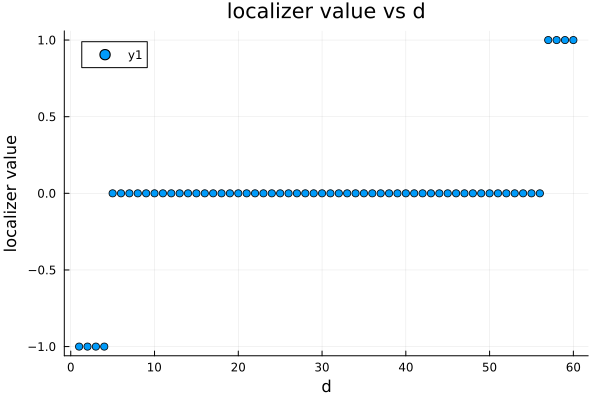

In [45]:
scatter(range(1,Lx,Lx), localizer_vals, xlabel="d", ylabel="localizer value", title="localizer value vs d")

In [46]:
N_PTB

360

In [47]:
# This function generates the value of localizer index at each point in the PTB

localizer_vals_all = zeros(N_PTB);
for ii = 1:N_PTB
    x_value = points_PTB_array_x[ii];
    y_value = points_PTB_array_y[ii];
    d_val = (x_value + y_value)/2;
    dmatrix_shiftedval = dlist_PTB - d_val*const_mat_PTB_orbitals;
    localizer_vals_all[ii] = 0.5 * matrix_signature((dmatrix_shiftedval + im*H_PTB_renor)*chiral_matrix);
    println("localizer_vals[", ii, "] = ", localizer_vals_all[ii])
end

localizer_vals[1] = 0.0
localizer_vals[2] = 0.0
localizer_vals[3] = -1.0
localizer_vals[4] = -1.0
localizer_vals[5] = -1.0
localizer_vals[6] = -1.0
localizer_vals[7] = -1.0
localizer_vals[8] = -1.0
localizer_vals[9] = -1.0
localizer_vals[10] = -1.0
localizer_vals[11] = -1.0
localizer_vals[12] = -1.0
localizer_vals[13] = -1.0
localizer_vals[14] = 0.0
localizer_vals[15] = -1.0
localizer_vals[16] = -1.0
localizer_vals[17] = -1.0
localizer_vals[18] = -1.0
localizer_vals[19] = 0.0
localizer_vals[20] = 0.0
localizer_vals[21] = 0.0
localizer_vals[22] = 0.0
localizer_vals[23] = -1.0
localizer_vals[24] = -1.0
localizer_vals[25] = -1.0
localizer_vals[26] = 0.0
localizer_vals[27] = 0.0
localizer_vals[28] = 0.0
localizer_vals[29] = 0.0
localizer_vals[30] = 0.0
localizer_vals[31] = 0.0
localizer_vals[32] = -1.0
localizer_vals[33] = 0.0
localizer_vals[34] = 0.0
localizer_vals[35] = 0.0
localizer_vals[36] = 0.0
localizer_vals[37] = 0.0
localizer_vals[38] = 0.0
localizer_vals[39] = 0.0
localizer_vals[

In [48]:
# Define the folder path (relative or absolute)
folder_path = "data/HOTI/"  # Change to your desired folder
# Ensure the folder exists
isdir(folder_path) || mkdir(folder_path)

filename = "t0=$(t0)_t=$(t)_m_0=$(m_0)_Delta=$(Delta)_x_periodic=$(x_periodic)_y_periodic=$(y_periodic)_L=$(L)_m=$(m)_c1=$(c1)_c2=$(c2).csv"


"t0=1.0_t=1.0_m_0=-1.0_Delta=1.0_x_periodic=0_y_periodic=0_L=60_m=0.6180339887498949_c1=7_c2=13.csv"

In [49]:



    local_density_on_lattice_dummy = fill(NaN, Lx*Ly)
    for ii = 1:length(localizer_vals_all)
        local_density_on_lattice_dummy[Int(PTB_index[ii])] = localizer_vals_all[ii]
    end
    density = zeros(Lx,Ly)

    local_density_dummy = copy(local_density_on_lattice_dummy)
    density_dummy_export = zeros(Lx*Ly,3)
	for a = 1:Lx
		for b = 1:Ly
			density_dummy_export[a + (b-1)*Lx,1] = a
            density_dummy_export[a + (b-1)*Lx,2] = b
            density_dummy_export[a + (b-1)*Lx,3] = local_density_dummy[a + (b-1)*Lx]
		end
	end

if exportdata==1
    CSV.write(string(folder_path,"localizer_index/onlyPTB",filename), (; localizer_vals_all),writeheader=false)
end
if exportdata==1
    df = DataFrame(x=density_dummy_export[:,1], y=density_dummy_export[:,2], value=density_dummy_export[:,3])
    CSV.write(string(folder_path,"localizer_index/all",filename), df, writeheader=false)
end

"data/HOTI/localizer_index/allt0=1.0_t=1.0_m_0=-1.0_Delta=1.0_x_periodic=0_y_periodic=0_L=60_m=0.6180339887498949_c1=7_c2=13.csv"

In [50]:
function plot_anything_in_PTB_to_parent_lattice(v::Array{Float64}, Lx, Ly)
    local_density_on_lattice = fill(NaN, Lx*Ly)
    for ii = 1:length(v)
        local_density_on_lattice[Int(PTB_index[ii])] = v[ii]
    end
    density = zeros(Lx,Ly)

    local_density = copy(local_density_on_lattice)
	for a = 1:Lx
		for b = 1:Ly
			density[a,b] = local_density[a + (b-1)*Lx];
		end
	end

	
	xx = range(1, stop=Lx, length=Lx)
	yy = range(1, stop=Ly, length=Ly)

	xx = repeat(xx, 1, Ly)'
	yy = repeat(yy, 1, Lx)

	# point_size = 500 * vec(density')

plt = scatter(
    vec(xx), vec(yy),
    marker_z = vec(density'),
    color = cgrad([:green, :red, :blue], [-1, 0, 1]), # Custom gradient
    colorbar = true,
    legend = false,
    xlabel = "X",
    ylabel = "Y",
    yguidefontrotation = 270, # Rotates the Y label vertically
    title = "Localizer Index",
    grid = false,
    markerstrokewidth = 0,
    aspect_ratio = 1,
    xlims = (0.5, Lx+0.5),             # Tight x-axis
    ylims = (0.5, Ly+0.5),              # Tight y-axis
    framestyle = :box,           # Box around plot
    xticks = [1, Lx],         # Set x-ticks
    yticks = [1, Ly],          # Set y-ticks
    tickfont = font(16, "Computer Modern"),
    guidefont = font(16, "Computer Modern"),
    titlefont = font(16, "Computer Modern"),
    markersize = 6
)


# plt = plot!(line_x,line_down_y,color="red",width=2, xlims=(0,Lx+1),ylims=(0,Ly+1),legend=:none,aspect_ratio=:equal,frame=:box, framestyle=:thick,xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly])
# plt = plot!(line_x,line_up_y,color="red",width=2)
# plt = plot!(line_x,line_middle.(line_x),color="blue",width=2)
# if exportdata==1
#     savefig(plt, string(folder_path, "localizer_index/", "localizer_spatial_dist.pdf"))
# end
return plt
end

plot_anything_in_PTB_to_parent_lattice (generic function with 1 method)

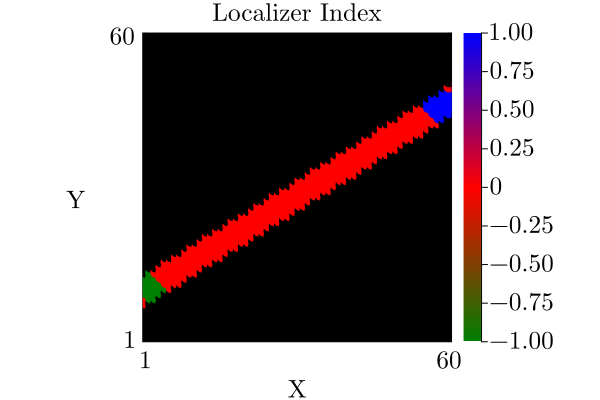

In [51]:
pltplt= plot_anything_in_PTB_to_parent_lattice(localizer_vals_all,Lx,Ly)

In [52]:
N_PTB

360

In [53]:
### Count the number of zeros and ones and minus ones in localizer_vals_all
num_zeros = count(==(0.0), localizer_vals_all)
num_ones = count(==(1.0), localizer_vals_all)
num_minus_ones = count(==(−1.0), localizer_vals_all)
println("Number of zeros in localizer_vals_all: ", num_zeros)
println("Number of ones in localizer_vals_all: ", num_ones)
println("Number of minus ones in localizer_vals_all: ", num_minus_ones)

Number of zeros in localizer_vals_all: 319
Number of ones in localizer_vals_all: 22
Number of minus ones in localizer_vals_all: 19


In [54]:
if exportdata == 1 && pltplt !== nothing
    savefig(pltplt, string(folder_path, "localizer_index/", filename,"localizer_spatial_dist_L=",L,"m=", m, ".pdf"))
else
    println("Warning: pltplt is nothing, not saving figure.")
end

"/work/submit/archi137/Documents/GitHub/lattices-julia/data/HOTI/localizer_index/t0=1.0_t=1.0_m_0=-1.0_Delta=1.0_x_periodic=0_y_periodic=0_L=60_m=0.6180339887498949_c1=7_c2=13.csvlocalizer_spatial_dist_L=60m=0.6180339887498949.pdf"

In [55]:
(energy_eigenvalues_PTB, eigenstates_PTB) = eigen(H_PTB_renor);

In [56]:
size(kron(diagm(ones(N_PTB)),eye2,eye2))

(1440, 1440)

In [57]:
# size(P_PTB)

In [58]:
println("size H_PTB_renor = ", size(H_PTB_renor))
println("size eigenstates = ", size(eigenstates_PTB))
# println("size filled_eigenstates = ", size(filled_eigenstates_PTB))
# println("size P = ", size(P_PTB))

size H_PTB_renor = (1440, 1440)
size eigenstates = (1440, 1440)


In [59]:
Gap_PTB = 2*minimum(abs.(energy_eigenvalues_PTB))

0.026657140910291588

In [60]:
energy_eigenvalues_PTB[Int(round(NOrbitalsInside/2))-6:Int(round(NOrbitalsInside/2)+6)]

13-element Vector{Float64}:
 -1.0272993804137711
 -1.02729290629969
 -1.0268961812957016
 -1.0268947283119616
 -0.9085667743592758
 -0.7656963040345914
 -0.7475198541923849
  0.013328570455145794
  0.6811505195108349
  0.7660615566718256
  0.8197805870225015
  0.9716249919988069
  1.0268948227697703

In [61]:
N_PTB, NOrbitalsInside

(360, 1440)

## Bulk boundary correspondence

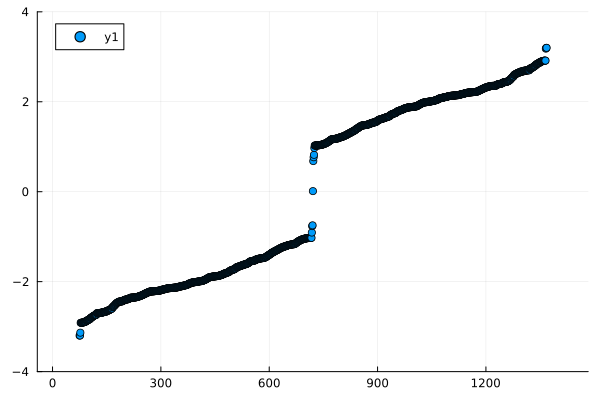

In [62]:
plt2 = scatter(1:NOrbitalsInside, energy_eigenvalues_PTB, ylims=(-4,4))
display(plt2)

In [63]:
energy_eigenvalues_PTB

1440-element Vector{Float64}:
  -1.8190911886699626e8
  -1.625563698527552e8
 -11.542667494512663
 -11.542606858072602
 -11.442130462311969
 -11.442108694448894
 -11.428533583929006
 -11.425644200984483
 -11.284651461172274
 -11.284591381612934
   ⋮
  11.284441650604998
  11.284664515212304
  11.425217329791012
  11.428719160390045
  11.440632688786758
  11.442200114959414
  11.542578669637308
  11.542673932898621
  14.577886916650618

In [64]:
energy_eigenvalues_PTB[2*N_PTB-2], energy_eigenvalues_PTB[2*N_PTB-1], energy_eigenvalues_PTB[2*N_PTB], energy_eigenvalues_PTB[2*N_PTB+1], energy_eigenvalues_PTB[2*N_PTB+2], energy_eigenvalues_PTB[2*N_PTB+3]

(-0.9085667743592758, -0.7656963040345914, -0.7475198541923849, 0.013328570455145794, 0.6811505195108349, 0.7660615566718256)

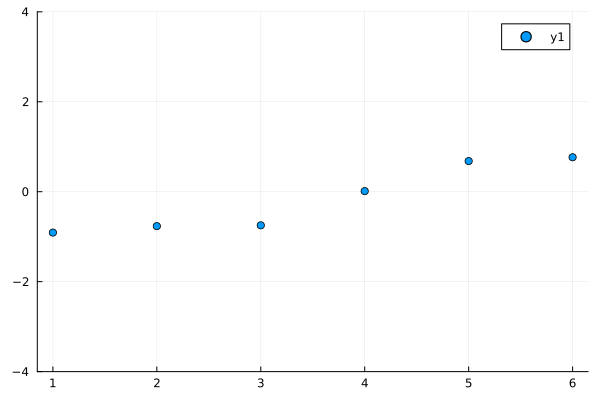

In [65]:
plt2 = scatter(energy_eigenvalues_PTB[Int(round(2*N_PTB))-2:Int(round(2*N_PTB))+3], ylims=(-4,4))

In [66]:
isdir(string(folder_path,"energies/")) || mkdir(string(folder_path,"energies/"))

if exportdata==1
    CSV.write(string(folder_path,"energies/",filename), (; energy_eigenvalues_PTB),writeheader=false)
end

"data/HOTI/energies/t0=1.0_t=1.0_m_0=-1.0_Delta=1.0_x_periodic=0_y_periodic=0_L=60_m=0.6180339887498949_c1=7_c2=13.csv"

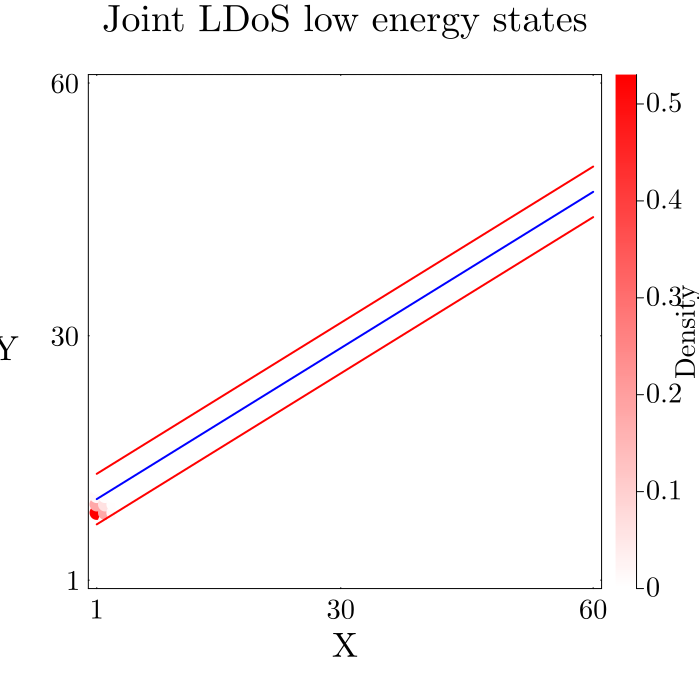

In [67]:
plotPTB_state_in_parent_lattice(eigenstates_PTB[:,2*N_PTB+1],L,L)

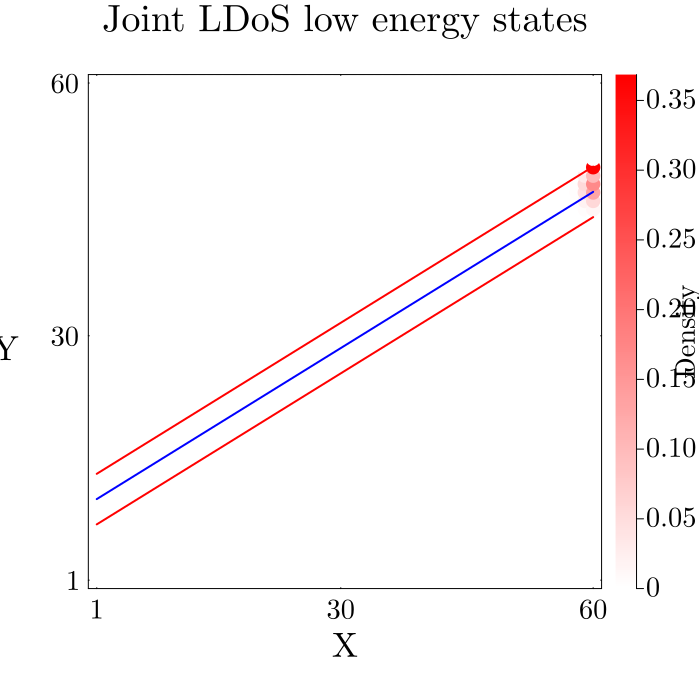

In [68]:
pltzerostate = plotPTB_density_in_parent_lattice(state_to_real_space_LDoS(eigenstates_PTB[:,2*N_PTB+2]),L,L)

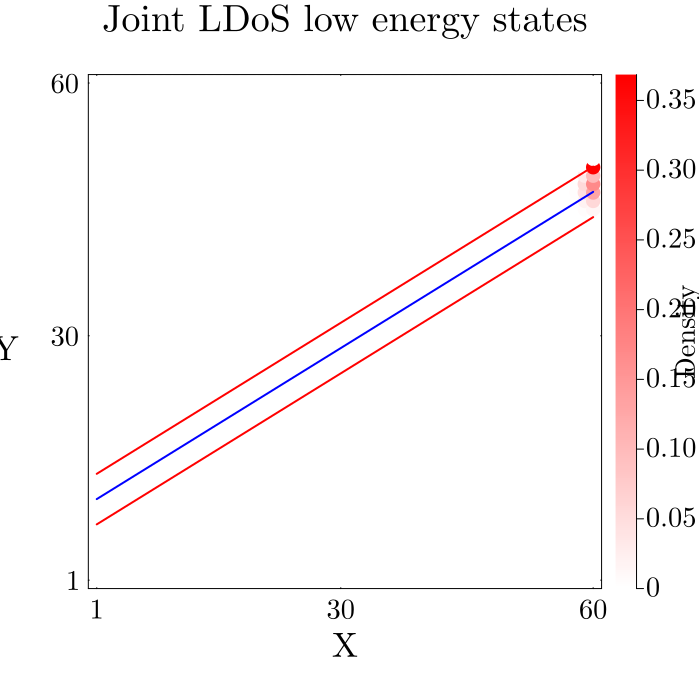

In [69]:
pltzerostate

In [70]:
filename

"t0=1.0_t=1.0_m_0=-1.0_Delta=1.0_x_periodic=0_y_periodic=0_L=60_m=0.6180339887498949_c1=7_c2=13.csv"

In [71]:
savefig(pltzerostate, string(folder_path, "LDOS/", filename,".pdf"))

"/work/submit/archi137/Documents/GitHub/lattices-julia/data/HOTI/LDOS/t0=1.0_t=1.0_m_0=-1.0_Delta=1.0_x_periodic=0_y_periodic=0_L=60_m=0.6180339887498949_c1=7_c2=13.csv.pdf"

## Plot of LDoS of topological states of PTB

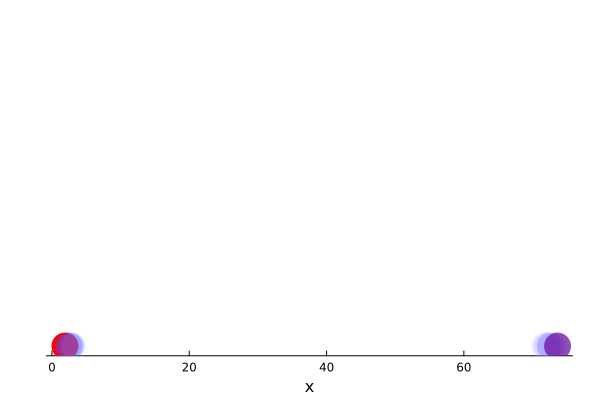

In [72]:
#boundary_state_nearest_zero = eigenstates_PTB[:,N_PTB];
probability_boundary_state = state_to_real_space_LDoS(eigenstates_PTB[:,2*N_PTB+2]) + state_to_real_space_LDoS(eigenstates_PTB[:,2*N_PTB+1]);

color_map = cgrad([RGB(1,1,1), RGB(0,0,1), RGB(1,0,0)])

# Calculate alphas based on y values
function alpha_function(p, pmax)
    if p < pmax/10
        return 0
    else
        return p/pmax
    end
end
alphas = alpha_function.(probability_boundary_state, maximum(probability_boundary_state))

#plt_PTB_BD_states = scatter(distance_along_projected_line, probability_boundary_state)
plt_PTB_BD_states = scatter(distance_along_projected_line, ones(N_PTB), 
                            zcolor=probability_boundary_state, legend=false, xlabel="x", colorbar_title="Value",
                            c=color_map, ms=15, seriesalpha=alphas, markerstrokewidth=0, grid=false,
                            yaxis=false)

display(plt_PTB_BD_states)

In [73]:
probability_boundary_state

360-element Vector{Float64}:
 0.00012190341717913462
 0.5303278757872959
 0.18195762099605733
 0.015607767303182868
 0.1820200819552058
 0.062455571770461904
 0.005357277385047843
 1.2246384524123264e-8
 0.015622634351248457
 0.005360791426836383
 ⋮
 0.04330780159727847
 0.12962376013225152
 3.300875922645246e-5
 0.003221986258391084
 0.05451669151574655
 0.16879220061538913
 0.03136855061694452
 0.09970299862819991
 0.3685341096675295

In [74]:
exportdata

1

In [75]:
isdir(string(folder_path,"LDOS/")) || mkdir(string(folder_path,"LDOS/"))

if exportdata==1
    CSV.write(string(folder_path,"LDOS/",filename), (; probability_boundary_state),writeheader=false)
end

"data/HOTI/LDOS/t0=1.0_t=1.0_m_0=-1.0_Delta=1.0_x_periodic=0_y_periodic=0_L=60_m=0.6180339887498949_c1=7_c2=13.csv"

In [82]:
t_end=time();

In [83]:
println("time taken = ", t_end - t_start," seconds")

time taken = 1918.2718629837036 seconds
